## Packages

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import LSTM, Dense, SimpleRNN, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import yfinance as yf
import datetime

## Data Pre-processing

In [2]:
# # startDate , as per our convenience we can modify
# start_date = datetime.datetime(2018, 1, 1)
 
# # endDate , as per our convenience we can modify
# end_date = datetime.datetime(2024, 1, 1)
# btc_info = yf.Ticker("BTC-USD")
 
# # pass the parameters as the taken dates for start and end
# df = btc_info.history(start = start_date, end = end_date)
# df

In [3]:
df = pd.read_csv('BTC_new.csv')
# df.columns = ['date','open', 'high', 'low', 'close', 'adj_close', 'vol']
# df = df.sort_values(by = ['date'], ascending=True)
df.index = pd.to_datetime(df['date'])
df.drop(['date'], axis=1, inplace=True)
df

,avg-block-size,avg-confirmation-time,blocks-size,cost-per-transaction-percent,cost-per-transaction,difficulty,estimated-transaction-volume-usd,estimated-transaction-volume,hash-rate,market-cap,...,n-transactions-per-block,n-transactions-total,n-transactions,n-unique-addresses,output-volume,total-bitcoins,trade-volume,transaction-fees-usd,transaction-fees,transactions-per-second
date,,,,,,,,,,,,,,,,,,,,,
2014-04-15,0.241621,NaN,17700.145907,4.312103,31.461496,6.119726e+09,6.737795e+07,146588.522890,5.932158e+04,5.814155e+09,...,400.049451,36853958.0,72809.0,156359.0,669588.742590,1.264937e+07,1.547115e+07,9.674245e+03,16.499545,NaN
2014-04-16,0.271066,NaN,17744.199359,2.176376,33.637923,6.119726e+09,1.235655e+08,236262.993009,4.532777e+04,6.617884e+09,...,431.408805,36926901.0,68594.0,149841.0,808972.686487,1.265370e+07,1.702180e+07,8.876057e+03,14.274446,NaN
2014-04-17,0.223713,NaN,17787.130813,3.960223,36.243881,6.978843e+09,6.833143e+07,129836.087704,6.036411e+04,6.661624e+09,...,385.739645,36995367.0,65190.0,131868.0,814063.297992,1.265771e+07,1.618354e+07,8.840666e+03,14.995538,NaN
2014-04-18,0.205560,NaN,17824.879464,6.280938,40.416473,6.978843e+09,4.413939e+07,88597.737449,5.411954e+04,6.308121e+09,...,356.225000,37060438.0,56996.0,128648.0,781666.572318,1.266182e+07,1.000750e+07,7.357991e+03,12.160113,NaN
2014-04-19,0.193319,NaN,17857.786874,7.890680,39.914189,6.978843e+09,3.141112e+07,65153.437509,5.654798e+04,6.106323e+09,...,336.572327,37117369.0,53515.0,118692.0,460095.566680,1.266583e+07,5.372537e+06,7.737646e+03,12.613149,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-07,1.884625,41.076088,562982.133215,1.500297,142.915261,8.312700e+13,5.011808e+09,72211.397350,7.024851e+08,1.364788e+12,...,3094.882353,985002826.0,526130.0,652726.0,554943.049164,1.967582e+07,1.684330e+08,1.506788e+06,21.723003,2.850000
2024-04-08,1.937860,44.144762,563302.582414,0.635671,159.310532,8.312700e+13,1.141858e+10,159660.840237,6.528979e+08,1.399943e+12,...,2883.651899,985528264.0,455617.0,685180.0,982666.187226,1.967685e+07,1.995999e+08,2.366374e+06,33.119632,3.633333
2024-04-09,1.803056,71.778546,563608.974102,0.615871,148.461847,8.312700e+13,1.093957e+10,156080.237383,6.033108e+08,1.380335e+12,...,3108.294521,985984696.0,453811.0,683771.0,837041.011677,1.967780e+07,4.625718e+08,3.306938e+06,47.245769,2.900000


In [4]:
# Prepare the volume and price differences, normalize volume
# BTC_vol = df["vol"].values
df_diff = df.diff().dropna() # difference of df
# df_diff["vol"] = np.log(1 + BTC_vol[:-1])  # Shifted by 1 to align with diff
df_aligned = df.loc[df_diff.index]
mask_train = (df_diff.index >= "2018-01-01") & (df_diff.index <= "2022-12-31")
df_train = df_diff.loc[mask_train].copy()
# Use df_aligned to ensure the indexes match
train_close = df_aligned.loc[mask_train, "market-price"].values

# Since indexes are aligned, this operation should now work without error
# df_train["Relative_Close"] = train_close / train_close[0]

df_train

,avg-block-size,avg-confirmation-time,blocks-size,cost-per-transaction-percent,cost-per-transaction,difficulty,estimated-transaction-volume-usd,estimated-transaction-volume,hash-rate,market-cap,...,n-transactions-per-block,n-transactions-total,n-transactions,n-unique-addresses,output-volume,total-bitcoins,trade-volume,transaction-fees-usd,transaction-fees,transactions-per-second
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,0.006326,1023.784067,169.048023,0.206866,16.657014,4.947513e+10,-6.392455e+08,-52367.147305,-2.017693e+05,6.701180e+08,...,-232.005702,291182.0,-48665.0,-85430.0,45119.283176,1995.606332,-5.062046e+08,-9.733984e+05,-75.731490,-0.716667
2018-01-02,-0.002015,-3236.025628,162.754373,-0.121677,-21.693162,8.555850e+09,8.461209e+08,54976.772860,1.439960e+06,7.953589e+09,...,444.310729,241676.0,99223.0,257519.0,853693.766232,2038.065956,-3.396831e+08,2.956526e+06,179.751940,0.766667
2018-01-03,0.024146,-3.384842,178.089352,0.225122,-11.380017,0.000000e+00,-4.521537e+08,-47450.491390,-1.343962e+06,1.812910e+10,...,528.022237,341182.0,54983.0,86729.0,279946.016717,2050.177427,7.045421e+08,2.034675e+06,100.520496,1.150000
2018-01-04,0.000319,-44.857164,167.274778,-0.342511,-1.935161,0.000000e+00,1.072951e+09,73787.366300,1.055970e+06,-2.301321e+09,...,7.752199,396637.0,29045.0,117181.0,-79059.151038,2033.974359,-3.053156e+08,2.276370e+05,28.575622,3.216667
2018-01-05,0.001803,21.597101,179.046596,-0.251170,13.872140,0.000000e+00,7.764369e+08,34005.315079,-2.399933e+06,1.547523e+10,...,-133.257076,424746.0,-82301.0,-166309.0,183405.273086,1943.750000,2.516515e+08,-4.931253e+05,-76.905074,-1.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,0.257142,3.075938,144.274855,-0.685810,-9.782225,0.000000e+00,4.074315e+08,24415.347096,-2.461140e+07,-9.284377e+08,...,348.793461,223730.0,15855.0,44400.0,81125.023442,764.404297,1.257359e+07,1.036513e+05,6.309813,0.416667
2022-12-28,-0.350080,-2.680955,158.907030,-0.080153,13.197474,0.000000e+00,6.853802e+08,41825.448730,9.317173e+07,-3.074664e+09,...,-456.686180,241524.0,33590.0,67888.0,132011.456488,884.375000,4.350590e+07,-5.613459e+04,-3.173740,0.066667
2022-12-29,0.236887,-10.064428,172.016181,-0.239070,-9.063155,0.000000e+00,2.527559e+08,15525.539811,-4.746485e+07,-9.181832e+08,...,261.509245,272625.0,-6994.0,7113.0,-3874.985534,965.625000,1.024085e+07,-2.566741e+03,-0.096425,0.083333


In [5]:
mask_test = (df_diff.index >= "2023-01-01") & (df_diff.index <= "2023-12-31")  # December 2018 for testing
df_test = df_diff.loc[mask_test].copy()
test_close = df_aligned.loc[mask_test, "market-price"].values
# df_test["Relative_Close"] = test_close / train_close[0]
df_test

,avg-block-size,avg-confirmation-time,blocks-size,cost-per-transaction-percent,cost-per-transaction,difficulty,estimated-transaction-volume-usd,estimated-transaction-volume,hash-rate,market-cap,...,n-transactions-per-block,n-transactions-total,n-transactions,n-unique-addresses,output-volume,total-bitcoins,trade-volume,transaction-fees-usd,transaction-fees,transactions-per-second
date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,-0.229010,-2.661761,167.280558,0.563673,18.672292,0.000000e+00,-5.012619e+08,-30159.999037,-1.757957e+06,-2.516038e+08,...,-343.584739,243379.0,-54809.0,-109257.0,-69276.988571,971.875000,-1.775555e+07,-8.420437e+04,-5.067509,-0.350000
2023-01-02,0.178520,2.398701,130.593933,-0.291685,-14.536744,0.000000e+00,2.208695e+08,12679.674983,1.757957e+06,2.770948e+09,...,260.392432,186842.0,41831.0,65913.0,130051.645395,971.875000,-2.785593e+07,2.965590e+04,1.711537,-0.650000
2023-01-03,0.227036,12.208635,159.245033,-0.539184,-12.013734,-1.154996e+12,7.540270e+08,45270.551511,-1.235785e+07,-2.887251e+07,...,296.417832,228331.0,42708.0,70315.0,139592.631805,967.994281,7.382737e+05,6.653980e+04,3.903536,1.483333
2023-01-04,-0.023806,-2.659854,192.549611,-0.226891,-4.114519,-1.154996e+11,5.419341e+08,31324.129285,-1.952700e+07,2.502068e+09,...,177.017483,273040.0,5881.0,7313.0,46652.401504,930.289170,2.628487e+07,3.580976e+04,2.046453,-1.116667
2023-01-05,-0.069425,-2.471033,174.724398,0.187202,5.309258,0.000000e+00,-3.639792e+08,-21813.623933,2.372721e+07,-2.739302e+07,...,-164.047882,276835.0,1455.0,29241.0,7059.983108,933.712517,2.157660e+07,-7.731045e+03,-0.502997,1.300000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,-0.090081,-153.619702,245.388589,-0.104202,4.096417,-7.812500e-02,1.220912e+09,27446.159772,-3.579445e+07,-9.686815e+07,...,245.713401,554034.0,-8137.0,64252.0,-22596.817798,837.402344,1.497777e+08,4.513808e+06,100.854420,3.091667
2023-12-28,0.024139,179.268507,216.207525,0.173315,17.351867,0.000000e+00,-1.918071e+09,-44412.943522,-2.863556e+07,1.413200e+09,...,-781.347684,544524.0,-128376.0,-54124.0,-70008.253711,781.347656,-6.509228e+07,-1.728688e+06,-36.794385,-4.291667
2023-12-29,-0.018622,-34.812113,205.595773,-0.199287,-17.256515,1.562500e-01,2.547654e+09,61622.121262,1.073833e+08,-8.848208e+09,...,402.887034,417578.0,164269.0,110074.0,114294.354264,850.000000,-2.561755e+06,-9.765210e+05,-20.243688,0.650000


## LSTM (unchanged from minute-by-minute example)

In [6]:
# Generate dataset function for LSTM
def generate_dataset_LSTM(df, seq_len):
    X_list, y_list = [], []
    for i in range(len(df) - seq_len):
        X_list.append(df.iloc[i:(i+seq_len), :].values)
        y_list.append(df["market-price"].iloc[i + seq_len])
    return np.array(X_list), np.array(y_list)


In [7]:
LAG = 5 # Example: Use the past # days to predict the next day
# Prepare training and test datasets
X_train_LSTM, y_train_LSTM = generate_dataset_LSTM(df_train, LAG)
X_test_LSTM, y_test_LSTM = generate_dataset_LSTM(pd.concat((df_train.iloc[-LAG:], df_test)), LAG)
X_train_LSTM.shape

(1809, 5, 27)

In [8]:
# model architecture
tf.keras.utils.set_random_seed(4012)
model = Sequential([
    LSTM(8, return_sequences=True, input_shape=(X_train_LSTM.shape[1], X_train_LSTM.shape[2])),
    LSTM(8, dropout=0.2),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# train the dataset
model.fit(X_train_LSTM, y_train_LSTM, batch_size=64, epochs=30, shuffle=True) 

Epoch 1/30


c:\Users\user\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1078929.3750
Epoch 2/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078905.0000 
Epoch 3/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078884.5000 
Epoch 4/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078853.7500 
Epoch 5/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078808.2500 
Epoch 6/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078753.7500 
Epoch 7/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078696.2500 
Epoch 8/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078644.6250 
Epoch 9/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078586.1250 
Epoch 10/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078452.3750 
Epoch 11/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078389.2500 
Epoch 12/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078295.1250 
Epoch 13/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1078105.6250 
Epoch 14/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1077987.3750 

In [9]:
# Predict and evaluate
pred_LSTM = np.squeeze(model.predict(X_test_LSTM))
print("Test MSE:", np.mean((pred_LSTM - y_test_LSTM)**2))

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Test MSE: 429144.3124665436


In [10]:
pred_LSTM, y_test_LSTM

(array([ 3.0864358 , -0.78292847,  5.3375936 ,  5.2636037 ,  3.6986217 ,
        -0.9895292 , -0.4296063 ,  1.558018  ,  2.0800858 ,  4.582299  ,
         6.0551896 ,  5.9048257 ,  6.3814607 ,  6.615274  ,  6.622623  ,
         1.8979406 ,  2.1838005 ,  6.223     , -4.4083505 , -5.027366  ,
         4.7780175 ,  6.434272  , -3.795682  ,  3.283473  ,  4.65291   ,
        -4.508107  ,  5.067022  , -4.4802423 ,  2.9689207 , -1.7837235 ,
         1.6965473 , -4.7918715 ,  4.676169  ,  6.1922846 , -4.4121842 ,
        -4.4704804 , -5.192404  , -5.365807  ,  4.983444  ,  6.2407193 ,
        -4.3914595 , -5.021389  , -4.804089  , -2.5941384 ,  2.1740522 ,
         6.369377  ,  6.6405435 ,  6.6071734 , -4.24451   ,  5.0765815 ,
         5.0742755 ,  3.2580214 ,  6.4608526 , -2.7819219 ,  5.5523324 ,
        -4.410971  ,  1.8861983 ,  1.8471459 ,  4.966909  , -3.201048  ,
         5.4285083 , -3.948648  , -4.889076  , -4.7336087 ,  3.671774  ,
         1.5689443 , -0.19881804, -3.979371  , -4.4

## MLP (flattening the previous 5-day data)

In [11]:
def gen_dataset_MLP(df, seq_len):
    df_X_extract = df.drop('market-price', axis=1)
    # [['open','high','low','vol','Relative_Close']]
    df_X = pd.DataFrame(columns=np.arange(0, (df.shape[1]-1)*seq_len))
    df_y = df[['market-price']][seq_len:]
    for i in range(len(df) - seq_len):
        df_i = pd.DataFrame(df_X_extract.iloc[i:(i+seq_len)].values.flatten(), columns=[0])
        df_X = pd.concat([df_X, df_i.T], axis=0)
    df_X = df_X.reset_index(drop=True)
    return df_X, df_y

In [12]:
X_train_MLP, y_train_MLP = gen_dataset_MLP(df_train, 5)

In [13]:
X_test_MLP, y_test_MLP = gen_dataset_MLP(df_test, 5)

In [14]:
X_train_MLP.shape

(1809, 130)

In [15]:
# # Model Pred rescale
# scaled_pred_MLP = model2.predict(X_test_MLP)
# scaled_pred_MLP_reshaped = np.zeros((scaled_pred_MLP.shape[0], df_test.shape[1]))
# scaled_pred_MLP_reshaped[:, 0] = scaled_pred_MLP[:, 0]  # Assuming the first column is the predicted closing price
# pred_MLP_reshaped = scaler.inverse_transform(scaled_pred_MLP_reshaped) # Apply inverse transformation
# pred_MLP = pred_MLP_reshaped[:, 0]
# pred_MLP

In [16]:
# # y_test_MLP rescale
# scaled_actual_MLP_reshaped = np.zeros((scaled_pred_MLP.shape[0], df_test.shape[1]))
# scaled_actual_MLP_reshaped[:, 0] = y_test_MLP['close']  # Assuming the first column is the predicted closing price
# actual_MLP_reshaped = scaler.inverse_transform(scaled_actual_MLP_reshaped) # Apply inverse transformation
# actual_MLP = actual_MLP_reshaped[:, 0]
# actual_MLP

#### 1. Number of Hidden Layers & Activation Functions

In [17]:
def build_model(num_layers, act_fcn, neuron, dropout, train_df = X_train_MLP):
    # tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(4012)
    
    model = Sequential()
    model.add(tf.keras.Input(shape=(train_df.shape[1],)))
    model.add(Dense(neuron, activation=act_fcn))
    
    for _ in range(num_layers):
        model.add(Dense(neuron, activation=act_fcn))

    model.add(Dropout(dropout))
    model.add(Dense(1))
    return model

num_layers_list = [0, 1, 2, 3]  
activation_fcns = ['sigmoid']
neurons = [32, 64, 128]
dropouts = [0, 0.2, 0.5, 0.7]
mse = tf.keras.losses.MeanSquaredError()
# mae = tf.keras.losses.MeanAbsoluteError()
no_lay_df = pd.DataFrame(columns = ['No_layers','Act_Fcns','Neurons','Dropout','MSE',
                                    # 'MAE'
                                    ])

for num_layers in num_layers_list:
    for act_fcn in activation_fcns:
        for neuron in neurons:
            for dropout in dropouts:
                model = build_model(num_layers, act_fcn, neuron, dropout)
                optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
                model.compile(optimizer=optimizer, loss='mse', metrics=['accuracy'])

                model.fit(X_train_MLP, y_train_MLP, batch_size=64, epochs=1000, shuffle=True)
                pred_MLP = model.predict(X_test_MLP)
                mse_MLP = mse(y_test_MLP, pred_MLP).numpy()
                # mae_MLP = mae(y_test_MLP, pred_MLP).numpy()

                no_lay_df_new = pd.DataFrame(dict(No_layers=[num_layers+1], Act_Fcns=[act_fcn],Neurons=[neuron], Dropout=[dropout], MSE=[mse_MLP],
                                                #   MAE=[mae_MLP]
                                                ))
                no_lay_df = pd.concat([no_lay_df, no_lay_df_new], axis=0, ignore_index=True)

Epoch 1/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 611us/step - accuracy: 0.0000e+00 - loss: 1079191.8750
Epoch 2/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 505us/step - accuracy: 0.0000e+00 - loss: 1079154.5000
Epoch 3/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step - accuracy: 0.0000e+00 - loss: 1079121.2500
Epoch 4/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - accuracy: 0.0000e+00 - loss: 1079087.8750
Epoch 5/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - accuracy: 0.0000e+00 - loss: 1079054.6250
Epoch 6/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 447us/step - accuracy: 0.0000e+00 - loss: 1079021.3750
Epoch 7/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - accuracy: 0.0000e+00 - loss: 1078988.0000
Epoch 8/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 468us/step - accuracy: 0.0000e+00 - loss: 1078954.6250
Epoch 9/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - accuracy: 0.0000e+00 - loss: 1078921.1250
Epoch 10/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - accuracy: 0.0000e+00 - loss: 1078887.8750
Epoch 11/1000
29/29

In [18]:
no_lay_df

,No_layers,Act_Fcns,Neurons,Dropout,MSE
0,1,sigmoid,32,0,413622.75000
1,1,sigmoid,32,0.2,415727.40625
2,1,sigmoid,32,0.5,419900.31250
3,1,sigmoid,32,0.7,423633.25000
4,1,sigmoid,64,0,395261.34375
5,1,sigmoid,64,0.2,398264.31250
6,1,sigmoid,64,0.5,404502.81250
7,1,sigmoid,64,0.7,410784.68750
8,1,sigmoid,128,0,380005.50000
9,1,sigmoid,128,0.2,382360.21875


In [31]:
no_lay_df.to_csv('MLP_raw_MSE.csv',index=False)

In [25]:
no_lay_df[no_lay_df['MSE']==min(no_lay_df['MSE'])]

,No_layers,Act_Fcns,Neurons,Dropout,MSE
8,1,sigmoid,128,0,380005.5


#### 2. Number of Neurons & Dropout Value

In [37]:
def build_model(neuron, dropout, act_fcn='sigmoid', train_df = X_train_MLP):
    tf.keras.utils.set_random_seed(4012)
    model = Sequential()
    model.add(tf.keras.Input(shape=(train_df.shape[1],)))
    model.add(Dense(neuron, activation=act_fcn))
    model.add(Dense(neuron, activation=act_fcn))
    # model.add(Dense(neuron, activation=act_fcn))
    # model.add(Dense(neuron, activation=act_fcn))
    model.add(Dropout(dropout))
    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss='mse', metrics=['accuracy'])
    return model

dropouts = [0, 0.2, 0.5, 0.7]
neurons = [32, 64, 128]
# activation_fcns = ['relu','sigmoid']
mse = tf.keras.losses.MeanSquaredError()
mae = tf.keras.losses.MeanAbsoluteError()
test_MLP_df = pd.DataFrame(columns = ['Neurons', 'Dropout','MSE','MAE'])

for dropout in dropouts:
    for neuron in neurons:
        model = build_model(neuron, dropout)

        model.fit(X_train_MLP, y_train_MLP, batch_size=64, epochs=100, shuffle=True)
        pred_MLP = model.predict(X_test_MLP)
        mse_MLP = mse(y_test_MLP, pred_MLP).numpy()
        mae_MLP = mae(y_test_MLP, pred_MLP).numpy()

        test_MLP_df_new = pd.DataFrame(dict(Neurons=[neuron],Dropout=[dropout],MSE=[mse_MLP],MAE=[mae_MLP]))
        test_MLP_df = pd.concat([test_MLP_df, test_MLP_df_new], axis=0, ignore_index=True)

Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 668us/step - accuracy: 0.0000e+00 - loss: 1078947.1250 
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 555us/step - accuracy: 0.0000e+00 - loss: 1078856.5000
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 573us/step - accuracy: 0.0000e+00 - loss: 1078776.5000
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - accuracy: 0.0000e+00 - loss: 1078691.1250
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step - accuracy: 0.0000e+00 - loss: 1078597.3750
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step - accuracy: 0.0000e+00 - loss: 1078492.1250
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 501us/step - accuracy: 0.0000e+00 - loss: 1078373.1250
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - accuracy: 0.0000e+00 - loss: 1078238.7500
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 501us/step - accuracy: 0.0000e+00 - loss: 1078087.8750
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - accuracy: 0.0000e+00 - loss: 1077921.0000
Epoch 11/100
29/29 ━━━━━━━━━

In [38]:
test_MLP_df

,Neurons,Dropout,MSE,MAE
0,32,0,429412.40625,435.965149
1,64,0,421402.12500,434.167938
2,128,0,406216.65625,430.535736
3,32,0.2,430932.18750,436.410889
4,64,0.2,425462.46875,435.499908
5,128,0.2,410624.81250,430.900543
6,32,0.5,431867.09375,436.864624
7,64,0.5,427227.31250,436.026764
8,128,0.5,414407.87500,431.498840
9,32,0.7,432788.40625,437.438385


In [39]:
test_MLP_df[test_MLP_df['MSE']==min(test_MLP_df['MSE'])]

,Neurons,Dropout,MSE,MAE
2,128,0,406216.65625,430.535736


In [40]:
test_MLP_df[test_MLP_df['MAE']==min(test_MLP_df['MAE'])]

,Neurons,Dropout,MSE,MAE
2,128,0,406216.65625,430.535736


#### Best Model 

In [27]:
# model architecture for MLP
tf.keras.utils.set_random_seed(4012)
model2 = Sequential()
model2.add(tf.keras.Input(shape=(X_train_MLP.shape[1],))) # input features
model2.add(Dense(128, activation='sigmoid'))
# model2.add(Dense(64, activation='sigmoid'))
# model2.add(Dense(64, activation='sigmoid'))
# model2.add(Dropout(0.5))
model2.add(Dense(1))

model2.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
model2.fit(X_train_MLP, y_train_MLP, batch_size=64, epochs=1000, shuffle=True)

Epoch 1/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 1078620.2500
Epoch 2/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 594us/step - loss: 1078441.1250
Epoch 3/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 582us/step - loss: 1078279.0000
Epoch 4/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 511us/step - loss: 1078117.3750
Epoch 5/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 538us/step - loss: 1077956.0000
Epoch 6/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 555us/step - loss: 1077794.6250
Epoch 7/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 607us/step - loss: 1077633.5000
Epoch 8/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 530us/step - loss: 1077472.7500
Epoch 9/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 542us/step - loss: 1077312.0000
Epoch 10/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 584us/step - loss: 1077151.7500
Epoch 11/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - loss: 1076991.7500
Epoch 12/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step - loss: 1076831.7500
Epoch 13/1000
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 573us/step - loss: 1076672.1250
Epoch 14/1000
29/29 ━

In [28]:
mse = tf.keras.losses.MeanSquaredError()
pred_MLP = model2.predict(X_test_MLP)
mse_MLP = mse(y_test_MLP, pred_MLP)
mse_LSTM = mse(y_test_LSTM, pred_LSTM)

mse_MLP, mse_LSTM

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


(<tf.Tensor: shape=(), dtype=float32, numpy=380005.5>,
 <tf.Tensor: shape=(), dtype=float32, numpy=429144.34>)

Text(0, 0.5, 'Difference in Price')

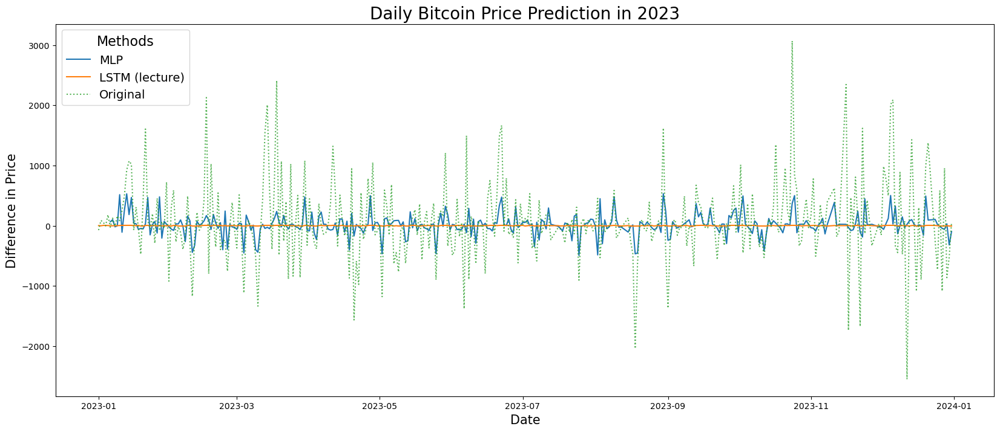

In [29]:
fig = plt.figure(figsize=(20,8))
plt.plot(np.array(df_test.index)[5:], pred_MLP, label='MLP')
plt.plot(np.array(df_test.index), pred_LSTM, label='LSTM (lecture)')
plt.plot(np.array(df_test.index), df_test["market-price"], label='Original', linestyle='dotted', alpha=0.8)
plt.legend(title='Methods',title_fontsize=16, fontsize=14)
plt.title('Daily Bitcoin Price Prediction in 2023', fontsize=20)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Difference in Price', fontsize=15)

Text(0, 0.5, 'Difference in Price')

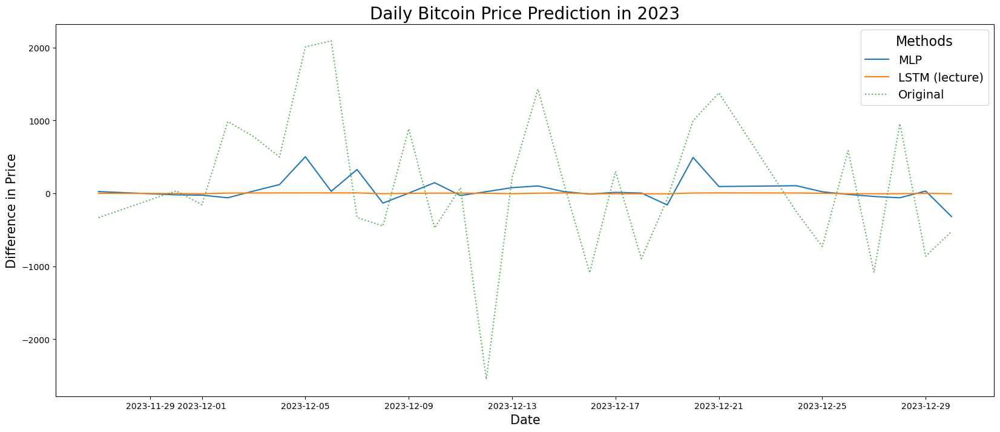

In [30]:
fig = plt.figure(figsize=(20,8))
plt.plot(np.array(df_test.index)[-31:-1], pred_MLP[-31:-1], label='MLP')
plt.plot(np.array(df_test.index)[-31:-1], pred_LSTM[-31:-1], label='LSTM (lecture)')
plt.plot(np.array(df_test.index)[-31:-1], df_test["market-price"][-31:-1], label='Original', linestyle='dotted', alpha=0.8)
plt.legend(title='Methods',title_fontsize=16, fontsize=14)
plt.title('Daily Bitcoin Price Prediction in 2023', fontsize=20)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Difference in Price', fontsize=15)

## MLP (median of past 5-day data)

In [45]:
def gen_dataset_MLP(df, seq_len):
    df_X_extract = df.drop('market-price', axis=1)
    # [['open','high','low','vol','Relative_Close']]
    df_X = pd.DataFrame(columns=df_X_extract.columns)
    df_y = df[['market-price']][seq_len:]
    for i in range(len(df) - seq_len):
        df_i = pd.DataFrame(df_X_extract.iloc[i:(i+seq_len)].median(axis=0), columns=[0])
        df_X = pd.concat([df_X, df_i.T], axis=0)
    df_X = df_X.reset_index(drop=True)
    return df_X, df_y

In [46]:
X_train_MLP, y_train_MLP = gen_dataset_MLP(df_train, 5)

In [47]:
X_test_MLP, y_test_MLP = gen_dataset_MLP(df_test, 5)

#### 1. Number of Hidden Layers & Activation Functions

In [48]:
def build_model(num_layers,act_fcn, train_df = X_train_MLP):
    # tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(4012)
    
    model = Sequential()
    model.add(tf.keras.Input(shape=(train_df.shape[1],)))
    model.add(Dense(64, activation=act_fcn))
    
    for _ in range(num_layers):
        model.add(Dense(64, activation=act_fcn))

    # model.add(Dropout(0.5))
    model.add(Dense(1))
    return model

num_layers_list = [0, 1, 2, 3]  
activation_fcns = ['relu','sigmoid']
mse = tf.keras.losses.MeanSquaredError()
mae = tf.keras.losses.MeanAbsoluteError()
no_lay_df = pd.DataFrame(columns = ['No_layers','Act_Fcns','MSE','MAE'])

for num_layers in num_layers_list:
    for act_fcn in activation_fcns:
        model = build_model(num_layers, act_fcn)
        optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
        model.compile(optimizer=optimizer, loss='mse', metrics=['accuracy'])

        model.fit(X_train_MLP, y_train_MLP, batch_size=64, epochs=100, shuffle=True)
        pred_MLP = model.predict(X_test_MLP)
        mse_MLP = mse(y_test_MLP, pred_MLP).numpy()
        mae_MLP = mae(y_test_MLP, pred_MLP).numpy()

        no_lay_df_new = pd.DataFrame(dict(No_layers=[num_layers+1], Act_Fcns=[act_fcn],MSE=[mse_MLP],MAE=[mae_MLP]))
        no_lay_df = pd.concat([no_lay_df, no_lay_df_new], axis=0, ignore_index=True)

Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 615us/step - accuracy: 0.0000e+00 - loss: 14422746066845696.0000
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 500us/step - accuracy: 0.0000e+00 - loss: 1190392062017536.0000
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - accuracy: 0.0000e+00 - loss: 141847787732992.0000
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - accuracy: 0.0000e+00 - loss: 81004593152000.0000
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - accuracy: 0.0000e+00 - loss: 68544402292736.0000
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step - accuracy: 0.0000e+00 - loss: 58397433004032.0000
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - accuracy: 0.0000e+00 - loss: 50702332198912.0000
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - accuracy: 0.0000e+00 - loss: 44181699428352.0000
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - accuracy: 0.0000e+00 - loss: 38326086139904.0000
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 648us/step - ac

In [49]:
no_lay_df

,No_layers,Act_Fcns,MSE,MAE
0,1,relu,1.320413e+12,8.322593e+05
1,1,sigmoid,4.302986e+05,4.409325e+02
2,2,relu,8.201086e+12,1.822841e+06
3,2,sigmoid,4.288391e+05,4.414657e+02
4,3,relu,3.104409e+11,3.425258e+05
5,3,sigmoid,4.301222e+05,4.417652e+02
6,4,relu,7.162174e+12,1.803820e+06
7,4,sigmoid,4.286717e+05,4.416522e+02


In [51]:
no_lay_df[no_lay_df['MSE']==min(no_lay_df['MSE'])]

,No_layers,Act_Fcns,MSE,MAE
7,4,sigmoid,428671.71875,441.652161


> best model: sigmoid & 4 layers

#### 2. Number of Neurons & Dropout Value

In [52]:
def build_model(neuron, dropout,act_fcn='sigmoid', train_df = X_train_MLP):
    tf.keras.utils.set_random_seed(4012)
    model = Sequential()
    model.add(tf.keras.Input(shape=(train_df.shape[1],)))
    model.add(Dense(neuron, activation=act_fcn))
    model.add(Dense(neuron, activation=act_fcn))
    model.add(Dense(neuron, activation=act_fcn))
    model.add(Dense(neuron, activation=act_fcn))
    model.add(Dropout(dropout))
    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss='mse', metrics=['accuracy'])
    return model

dropouts = [0, 0.2, 0.5, 0.7]
neurons = [32, 64, 128]
# activation_fcns = ['relu','sigmoid']
mse = tf.keras.losses.MeanSquaredError()
mae = tf.keras.losses.MeanAbsoluteError()
test_MLP_df = pd.DataFrame(columns = ['Neurons', 'Dropout','MSE','MAE'])

for dropout in dropouts:
    for neuron in neurons:
        model = build_model(neuron, dropout)

        model.fit(X_train_MLP, y_train_MLP, batch_size=64, epochs=100, shuffle=True)
        pred_MLP = model.predict(X_test_MLP)
        mse_MLP = mse(y_test_MLP, pred_MLP).numpy()
        mae_MLP = mae(y_test_MLP, pred_MLP).numpy()

        test_MLP_df_new = pd.DataFrame(dict(Neurons=[neuron],Dropout=[dropout],MSE=[mse_MLP],MAE=[mae_MLP]))
        test_MLP_df = pd.concat([test_MLP_df, test_MLP_df_new], axis=0, ignore_index=True)

Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 743us/step - accuracy: 0.0000e+00 - loss: 1078932.7500 
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - accuracy: 0.0000e+00 - loss: 1078906.5000
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 632us/step - accuracy: 0.0000e+00 - loss: 1078897.3750
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 589us/step - accuracy: 0.0000e+00 - loss: 1078882.7500
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 558us/step - accuracy: 0.0000e+00 - loss: 1078859.1250
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 555us/step - accuracy: 0.0000e+00 - loss: 1078822.1250
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - accuracy: 0.0000e+00 - loss: 1078767.5000
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 559us/step - accuracy: 0.0000e+00 - loss: 1078692.3750
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - accuracy: 0.0000e+00 - loss: 1078597.7500
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 524us/step - accuracy: 0.0000e+00 - loss: 1078488.8750
Epoch 11/100
29/29 ━━━━━━━━━

In [53]:
test_MLP_df

,Neurons,Dropout,MSE,MAE
0,32,0,431683.34375,440.186951
1,64,0,428671.71875,441.652161
2,128,0,425086.21875,444.964752
3,32,0.2,432378.62500,440.151764
4,64,0.2,428703.87500,441.497650
5,128,0.2,425086.21875,444.219971
6,32,0.5,433248.50000,440.118408
7,64,0.5,429797.28125,440.936859
8,128,0.5,426025.00000,442.961029
9,32,0.7,433942.46875,440.157135


In [56]:
test_MLP_df[test_MLP_df['MSE']==min(test_MLP_df['MSE'])]

,Neurons,Dropout,MSE,MAE
2,128,0,425086.21875,444.964752
5,128,0.2,425086.21875,444.219971


### Best Model

In [58]:
# model architecture for MLP: 4 64-nueron layers
tf.keras.utils.set_random_seed(4012)
model2 = Sequential()
model2.add(tf.keras.Input(shape=(X_train_MLP.shape[1],))) # input features
model2.add(Dense(128, activation='sigmoid'))
model2.add(Dense(128, activation='sigmoid'))
model2.add(Dense(128, activation='sigmoid'))
model2.add(Dense(128, activation='sigmoid'))
model2.add(Dense(1))

model2.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
model2.fit(X_train_MLP, y_train_MLP, batch_size=64, epochs=100, shuffle=True)

Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 1078943.1250 
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 1078754.3750
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 1078489.8750
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 1077971.2500
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 1077481.8750
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 1077105.0000
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 1076781.1250
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 1076489.2500
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 1076230.2500
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 1075996.6250
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 1075760.8750
Epoch 12/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 1075533.6250
Epoch 13/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 1075312.0000
Epoch 14/100
29/29 ━━━━━━━━━━━━━━

In [59]:
mse = tf.keras.losses.MeanSquaredError()
pred_MLP = model2.predict(X_test_MLP)
mse_MLP = mse(y_test_MLP, pred_MLP)
mse_LSTM = mse(y_test_LSTM, pred_LSTM)
pd.DataFrame(dict(Methods=['MLP','LSTM'],MSE=[mse_MLP.numpy(), mse_LSTM.numpy()]))

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


,Methods,MSE
0,MLP,425086.21875
1,LSTM,429144.34375


Text(0, 0.5, 'Difference in Price')

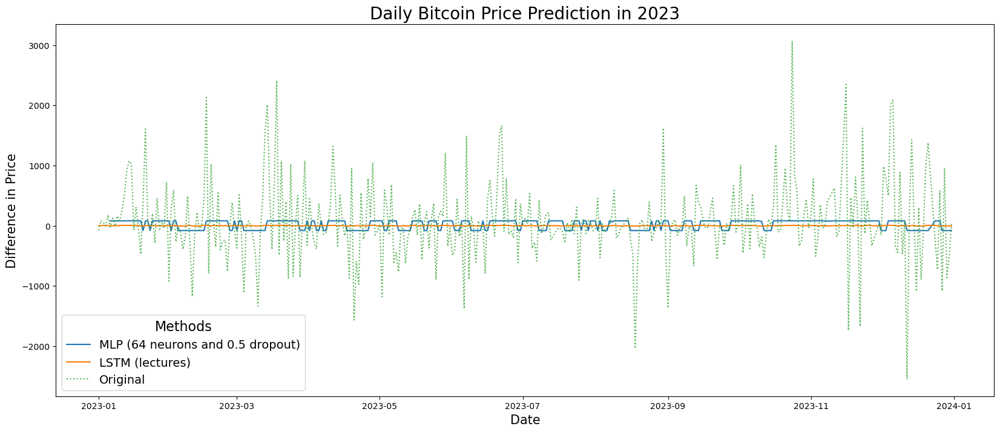

In [60]:
fig = plt.figure(figsize=(20,8))
plt.plot(np.array(df_test.index)[5:], pred_MLP, label='MLP (64 neurons and 0.5 dropout)')
plt.plot(np.array(df_test.index), pred_LSTM, label='LSTM (lectures)')
plt.plot(np.array(df_test.index), df_test["market-price"], label='Original', linestyle='dotted', alpha=0.8)
plt.legend(title='Methods',title_fontsize=16, fontsize=14)
plt.title('Daily Bitcoin Price Prediction in 2023', fontsize=20)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Difference in Price', fontsize=15)

Text(0, 0.5, 'Difference in Price')

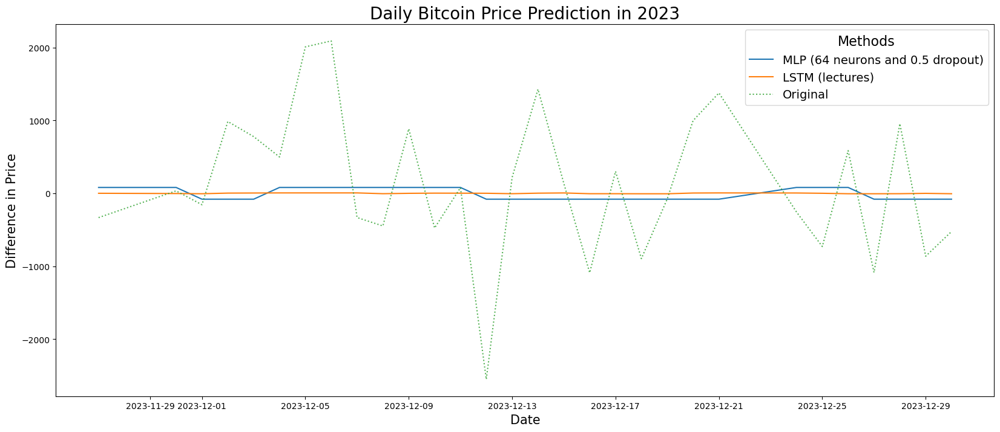

In [61]:
fig = plt.figure(figsize=(20,8))
plt.plot(np.array(df_test.index)[-31:-1], pred_MLP[-31:-1], label='MLP (64 neurons and 0.5 dropout)')
plt.plot(np.array(df_test.index)[-31:-1], pred_LSTM[-31:-1], label='LSTM (lectures)')
plt.plot(np.array(df_test.index)[-31:-1], df_test["market-price"][-31:-1], label='Original', linestyle='dotted', alpha=0.8)
plt.legend(title='Methods',title_fontsize=16, fontsize=14)
plt.title('Daily Bitcoin Price Prediction in 2023', fontsize=20)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Difference in Price', fontsize=15)